# 01 Loading our custom made functions file

In [ ]:
import importlib
import functions

importlib.reload(functions)


## 02 Loading the folder that contains our data

In [ ]:
import glob
import getpass
user= (getpass.getuser())
print("Hello", user)

base='C:\\Users\\{}\\Dropbox\\CPLab'.format(user)
files = glob.glob(base+'\\all_data_mat_filtered\\*.mat')
savepath = base+'\\results\\'
print(files)

In [ ]:
keyboard_dict={'98':'b','119':'w','120':'nc','49':'1','48':'0'}

## 03  Looping through all the data files

In [ ]:
import os
import h5py
import numpy as np
import pandas as pd
import pickle

files=[f'C:\\Users\\{user}\\Dropbox\\CPLab\\all_data_mat_filtered\\20230615_dk6_BW_context_day1.mat'] #This is just for testing purposes
events_codes_all = {}
for file in files:
    # Initialize an empty DataFrame to store the results for all epochs
    compiled_data_all_epochs = pd.DataFrame()
    ## Get the date, mouse_id and task from the file name
    base_name = os.path.basename(file)
    base_name, _ = os.path.splitext(base_name)

    date, mouse_id, task=functions.exp_params(base_name)
    print(date, mouse_id, task)
    ## Open the file
    f=h5py.File(file, 'r')
    channels = list(f.keys())
    print(channels)

    if 'Keyboard' in channels:
        events = f['Keyboard']
    elif 'keyboard' in channels:
        events = f['keyboard']
    elif 'memory' in channels:
        events = f['memory']
    elif 'Memory' in channels:
        events = f['Memory']

    events_codes=np.array(events['codes'][0])
    events_times=np.array(events['times'][0])
    events_codes_all[base_name] = events_codes
    #Generating epochs from events (epochs are basically start of a trial and end of a trial)
    epochs=functions.generate_epochs_with_first_event(events_codes, events_times)

    # Experiment Start time
    first_event=events_times[0]

    for channeli in channels:
        if "AON" in channeli or  "vHp" in channeli :
            
            channel_id=channeli
            # Extracting raw data and time
            data_all=f[channeli]
            raw_data=np.array(data_all['values']).flatten()
            raw_time = np.array(data_all['times']).flatten()
            sampling_rate = int(1/data_all['interval'][0][0])
            print(raw_data.shape, raw_time.shape, sampling_rate)
            # Normalizing the data by subtracting the mean and std of data 30sec before the first event
            normalized_data,time,data_before=functions.data_normalization(raw_data,raw_time,first_event, sampling_rate)

            # Applying a notch filter
            notch_filtered_data=functions.iir_notch(normalized_data, sampling_rate,60)
            total=notch_filtered_data
            # Extracting the bands
            beta=functions.beta_band(notch_filtered_data, sampling_rate)
            gamma=functions.gamma_band(notch_filtered_data, sampling_rate)
            theta=functions.theta_band(notch_filtered_data, sampling_rate)

            all_bands=[total,beta, gamma, theta]

            for i,epochi in enumerate(epochs):
                compiled_data = pd.DataFrame()

                trial_timestamp = epochi[0][0]
                trial_type = epochi[0][1]
                dig_type = epochi[1, 1]
                print(dig_type)
                dig_timestamp = epochi[1, 0]
                print(trial_timestamp,trial_type,dig_timestamp,dig_type)
                for bandi in all_bands:
                    data_trial_before, data_trial_after=functions.extract_trial_data(bandi,time,trial_timestamp,sampling_rate)
                    data_dig_before, data_dig_after=functions.extract_dig_data(bandi,time,dig_timestamp,sampling_rate)

                                        # Create a DataFrame for the current bandi
                    bandi_data = pd.DataFrame({
                        'data_trial_before': [data_trial_before],
                        'data_trial_after': [data_trial_after],
                        'data_dig_before': [data_dig_before],
                        'data_dig_after': [data_dig_after]
                    })
                    
                    # Concatenate the current bandi DataFrame with the compiled_data DataFrame along axis=1
                    compiled_data = pd.concat([compiled_data, bandi_data], axis=1)
                compiled_data.columns = ['total_pre_door', 'total_post_door', 'total_pre_odor', 'total_post_odor',
                            'beta_pre_door', 'beta_post_door', 'beta_pre_odor', 'beta_post_odor',
                            'gamma_pre_door', 'gamma_post_door', 'gamma_pre_odor', 'gamma_post_odor',
                            'theta_pre_door', 'theta_post_door', 'theta_pre_odor', 'theta_post_odor']
                compiled_data.insert(0, 'rat', mouse_id)
                compiled_data.insert(1, 'date', date)
                compiled_data.insert(2, 'experiment', task)
                compiled_data.insert(3, 'channel', channel_id)
                compiled_data.insert(4, 'trial', i)
                compiled_data.insert(5, 'side', keyboard_dict[str(int(trial_type))])
                compiled_data.insert(6, 'correct?', keyboard_dict[str(int(dig_type))])
                compiled_data.insert(7, 'first 30 seconds power', functions.calculate_power_1D(data_before))
                compiled_data_all_epochs = pd.concat([compiled_data_all_epochs, compiled_data], axis=0, ignore_index=True)
    
    #compiled_data_all_epochs.to_csv(f'{base_name}_compiled_data.csv', index=False)
    with open(os.path.join(savepath, f'{base_name}_compiled_data.pkl'), 'wb') as file:
        pickle.dump(compiled_data_all_epochs, file)
                # Extracting data around events
    #         
    # data_around_events=functions.data_events_extract(notch_filtered_data,time,epochs,sampling_rate)

    #         beta_around_events=functions.data_events_extract(beta,time,epochs,sampling_rate)
    #         gamma_around_events=functions.data_events_extract(gamma,time,epochs,sampling_rate)
    #         theta_around_events=functions.data_events_extract(theta,time,epochs,sampling_rate)

    #         # Creating a dataframe
    #         new_row=pd.DataFrame({'experiment_id':base_name,'channel_id':channel_id,
    #                             'epochs':[epochs],'first_event':[first_event],
    #                             'data_around_events':[data_around_events],
    #                             'beta_around_events':[beta_around_events],
    #                             'gamma_around_events':[gamma_around_events],
    #                             'theta_around_events':[theta_around_events]})
    #         try:
    #             compiled_data=pd.concat([compiled_data,new_row],ignore_index=True)
    #         except Exception as e:
    #             print(e)
    #     import pickle

    # #Save the DataFrame to a pickle file
    # with open(f'{base_name}_compiled_data.pkl', 'wb') as file:
    #     pickle.dump(compiled_data, file)

In [ ]:
compiled_data['total_post_door'][0]

## 4.1 Here we plot spectrogram of a single event

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Generate the spectrogram
Pxx, freqs, bins, im = plt.specgram(compiled_data['total_post_door'][0], Fs=sampling_rate, cmap="rainbow", NFFT=512, noverlap=256)

# Find the maximum intensity for each frequency bin
max_intensity_indices = np.argmax(Pxx, axis=1)
max_intensities = Pxx[np.arange(Pxx.shape[0]), max_intensity_indices]

# Find the corresponding frequencies
most_intense_frequencies = freqs[np.argmax(max_intensities)]

# Print the most intense frequencies
print("Most intense frequencies (Hz):", most_intense_frequencies)

# Plot the spectrogram
plt.title('Spectrogram Using matplotlib.pyplot.specgram() Method')
plt.xlabel("TIME")
plt.ylabel("FREQUENCY (Hz)")
plt.ylim(0, 100)
# plt.yscale('log')
plt.colorbar(im).set_label('Intensity [dB]')

# Plot horizontal bands for theta, beta, and gamma oscillations
plt.axhline(y=4, color='blue', linestyle='--', label='Theta (4-8 Hz)')
plt.axhline(y=8, color='blue', linestyle='--')
plt.axhline(y=12, color='green', linestyle='--', label='Beta (12-30 Hz)')
plt.axhline(y=30, color='green', linestyle='--')
plt.axhline(y=31, color='red', linestyle='--', label='Gamma (30-100 Hz)')
plt.axhline(y=100, color='red', linestyle='--')

# Add a legend
plt.legend()

# Display the plot
plt.show()

## 4.2 here we plot spectrograms of the four events of interest.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
total_bands=['total_pre_door', 'total_post_door', 'total_pre_odor', 'total_post_odor']

fig, axs=plt.subplots(2,2)
axs=axs.flatten()
for i,bandi in enumerate(total_bands):
    ax=axs[i]
    
    # Generate the spectrogram
    Pxx, freqs, bins, im = ax.specgram(compiled_data[bandi][0], Fs=sampling_rate, cmap="rainbow", NFFT=512, noverlap=256)

    # Find the maximum intensity for each frequency bin
    max_intensity_indices = np.argmax(Pxx, axis=1)
    max_intensities = Pxx[np.arange(Pxx.shape[0]), max_intensity_indices]

    # Find the corresponding frequencies
    most_intense_frequencies = freqs[np.argmax(max_intensities)]

    # Print the most intense frequencies
    print("Most intense frequencies (Hz):", most_intense_frequencies)
    
    # Plot the spectrogram
    ax.set_title('{}'.format(bandi))
    ax.set_xlabel("TIME")
    ax.set_ylabel("FREQUENCY (Hz)")
    ax.set_ylim(0, 100)
    # ax.yscale('log')
    cbar = fig.colorbar(im, ax=ax)
    cbar.set_label('Intensity [dB]')


    # Plot horizontal bands for theta, beta, and gamma oscillations
    ax.axhline(y=4, color='blue', linestyle='--', label='Theta (4-8 Hz)')
    ax.axhline(y=8, color='blue', linestyle='--')
    ax.axhline(y=12, color='green', linestyle='--', label='Beta (12-30 Hz)')
    ax.axhline(y=30, color='green', linestyle='--')
    ax.axhline(y=31, color='red', linestyle='--', label='Gamma (30-100 Hz)')
    ax.axhline(y=100, color='red', linestyle='--')
    print('here')
# Add a legend
#plt.legend()
plt.tight_layout()

# Display the plot
plt.show()

## 4.3 Now we will plot 20 spectrograms of the 20 trials that have happened for a single channel

In [ ]:
print(row['total_post_door'])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Most intense frequencies for trial 60, total_pre_door (Hz): 7.8125
Most intense frequencies for trial 60, total_post_door (Hz): 7.8125
Most intense frequencies for trial 60, total_pre_odor (Hz): 7.8125
Most intense frequencies for trial 60, total_post_odor (Hz): 7.8125
Most intense frequencies for trial 61, total_pre_door (Hz): 11.71875
Most intense frequencies for trial 61, total_post_door (Hz): 7.8125
Most intense frequencies for trial 61, total_pre_odor (Hz): 7.8125
Most intense frequencies for trial 61, total_post_odor (Hz): 15.625
Most intense frequencies for trial 62, total_pre_door (Hz): 15.625
Most intense frequencies for trial 62, total_post_door (Hz): 19.53125
Most intense frequencies for trial 62, total_pre_odor (Hz): 19.53125
Most intense frequencies for trial 62, total_post_odor (Hz): 3.90625
Most intense frequencies for trial 63, total_pre_door (Hz): 7.8125
Most intense frequencies for trial 63, total_post_door (Hz): 11.71875
Most intense frequencies for trial 63, total_p

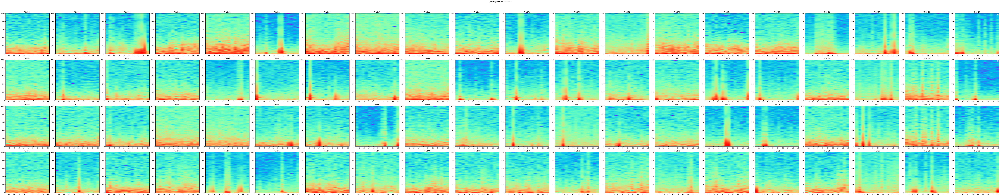

In [49]:
import numpy as np
import matplotlib.pyplot as plt

lfp4_aon_data = compiled_data_all_epochs[compiled_data_all_epochs['channel'] == 'LFP4_AON']
total_bands=['total_pre_door', 'total_post_door', 'total_pre_odor', 'total_post_odor']

# Determine the number of trials
num_trials = len(lfp4_aon_data)

# Create a superfigure with 2 rows and num_trials columns
fig, axs = plt.subplots(4, num_trials, figsize=(5*num_trials, 5*len(total_bands)))
fig.suptitle('Spectrograms for Each Trial')

# Iterate through each trial
for trial_idx, (i, row) in enumerate(lfp4_aon_data.iterrows()):
    for band_idx, bandi in enumerate(total_bands):
        ax = axs[band_idx, trial_idx]
        
        # Generate the spectrogram
        Pxx, freqs, bins, im = ax.specgram(row[bandi], Fs=sampling_rate, cmap="rainbow", NFFT=512, noverlap=256)

        # Find the maximum intensity for each frequency bin
        max_intensity_indices = np.argmax(Pxx, axis=1)
        max_intensities = Pxx[np.arange(Pxx.shape[0]), max_intensity_indices]

        # Find the corresponding frequencies
        most_intense_frequencies = freqs[np.argmax(max_intensities)]

        # Print the most intense frequencies
        print(f"Most intense frequencies for trial {i}, {bandi} (Hz):", most_intense_frequencies)
        
        # Plot the spectrogram
        ax.set_title(f'Trial {i}')
        # ax.set_xlabel("TIME")
        # ax.set_ylabel("FREQUENCY (Hz)")
        # ax.set_ylim(0, 100)
        # # ax.set_yscale('log')
        # cbar = fig.colorbar(im, ax=ax)
        # cbar.set_label('Intensity [dB]')

        # # Plot horizontal bands for theta, beta, and gamma oscillations
        # ax.axhline(y=4, color='blue', linestyle='--', label='Theta (4-8 Hz)')
        # ax.axhline(y=8, color='blue', linestyle='--')
        # ax.axhline(y=12, color='green', linestyle='--', label='Beta (12-30 Hz)')
        # ax.axhline(y=30, color='green', linestyle='--')
        # ax.axhline(y=31, color='red', linestyle='--', label='Gamma (30-100 Hz)')
        # ax.axhline(y=100, color='red', linestyle='--')

# Add a legend to the last subplot in each row
axs[0, -1].legend()
axs[1, -1].legend()

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.95])

# Display the plot
plt.show()